# Driven Damped Pendulum

<center><img src='ddp_diagram.png'/></center>

Equation of motion for a driven damped pendulum  

$$
\Large
\ddot{\phi} + 2 \beta \dot{\phi} + \omega_{0}^{2} sin\phi = \gamma \omega_{0}^{2} \; cos\,\omega t \tag{1}
$$

Where:
$$
\gamma \equiv \mbox{drive strength} \\
\omega_{0} \equiv \mbox{natural frequency of pendulum} \\
\omega \equiv \mbox{drive frequency} \\
\beta \equiv \mbox{damping constant} \\
F_{0} \equiv \mbox{drive amplitude} \\
$$

$$F(t) = F_{0} cos(\omega t)$$ \
$$\frac{b}{m} = 2\beta$$ \
$$\frac{g}{L} = \omega_{0}^{2}$$ \
$$\gamma = \frac{F_{0}}{mL\omega_{0}^{2}} = \frac{F_{0}}{mg}$$

<center><img src='ddp_diagram.png'/></center>

To be able to solve this numerically, we first need to make some substitutions to make equation (1) a first order differential equation. We do this by solving equation (1) for $\ddot{\phi}$


\begin{equation}
\Large
\ddot{\phi} = \gamma \omega_{0}^{2} \; cos\,\omega t - 2 \beta \dot{\phi} - \omega_{0}^{2} sin\phi \tag{2}
\end{equation}

$$
\Large
\dot{\phi} = \alpha \\
\Large
\dot{\alpha} = -2 \beta \alpha - \omega_{0}^{2} sin\phi + \gamma \omega_{0}^{2} \; cos\,\omega t
$$

In [1]:
import matplotlib.animation as animation
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np

from IPython.display import HTML

In [36]:
def ddp(y, t, gamma, omega, omega_0, beta):
    phi, alpha = y
    dydt = [alpha, -2 * beta * alpha - omega_0**2 * np.sin(phi) + gamma * omega_0**2 * np.cos(omega * t)]
    return dydt

gamma = 0.9
omega = 2 * np.pi
omega_0 = 1.5 * omega
beta = omega_0 / 4

y0 = [0.0, 0.0]
dt = 0.05
t = np.arange(0, 8, dt)

sol = odeint(ddp, y0, t, args=(gamma, omega, omega_0, beta))

phi = sol[:, 0]
phi_dot = sol[:, 1]

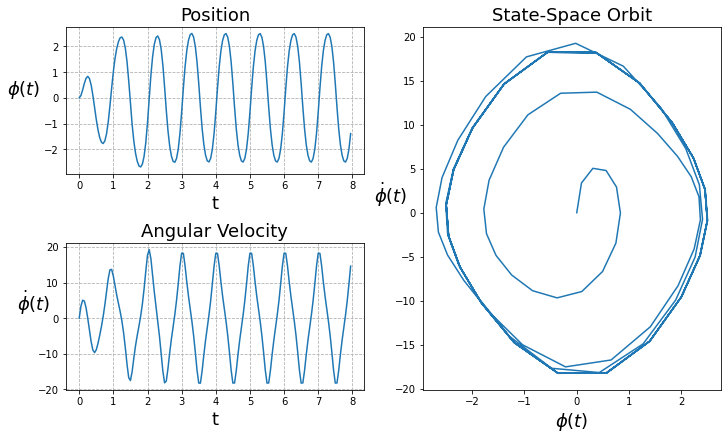

In [37]:
fig = plt.figure(figsize=(10,6), constrained_layout=True)
gs = GridSpec(2, 4, figure=fig)
# Font Size
FS = 18

ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[1, 0:2])
ax3 = fig.add_subplot(gs[:, 2:])

ax1.set_title("Position", fontsize=FS)
ax1.plot(t, phi)
ax1.set_xlabel('t', fontsize=FS)
ax1.set_ylabel('$\phi(t)$', rotation=0, labelpad=20, fontsize=FS)
ax1.grid(linestyle="--")

ax2.set_title("Angular Velocity", fontsize=FS)
ax2.plot(t, phi_dot)
ax2.set_xlabel('t', fontsize=FS)
ax2.set_ylabel('$\dot{\phi}(t)$', rotation=0, fontsize=FS)
ax2.grid(linestyle="--")

ax3.set_title("State-Space Orbit", fontsize=FS)
ax3.plot(phi, phi_dot)
ax3.set_xlabel('$\phi(t)$', fontsize=FS)
ax3.set_ylabel('$\dot{\phi}(t)$', rotation=0, fontsize=FS)
plt.show();

In [38]:
fig = plt.figure(figsize=(8, 6), constrained_layout=True)
gs = GridSpec(2, 2, figure=fig)
# Font Size
FS = 18

ax1 = fig.add_subplot(gs[:, 0])
ax2 = fig.add_subplot(gs[:, 1])

ax1.set_title("Driven Damped Pendulum", fontsize=FS, pad=10)
ax1.grid(linestyle="--")
ax1.axis([-1.5, 1.5, -1.5, 1.5])

line1, = ax1.plot([], [], 'o-', lw=2)
line2, = ax2.plot([], [], 'o-', lw=2, c='r')

time_template = 'time = %.1fs'
time_text = ax1.text(0.05, 0.9, '', transform=ax1.transAxes)

ax2.set_title("Angle ($\phi$) with Respect to Vertical", fontsize=FS, pad=10)
ax2.plot(phi, t, zorder=0)
ax2.set_xlabel('$\phi$(t)', fontsize=FS)
ax2.set_ylabel('t', rotation=0, fontsize=FS, labelpad=10)

x_s = np.sin(phi)
y_s = -np.cos(phi)


def animate(i):
    thisx = [0, x_s[i]]
    thisy = [0, y_s[i]]

    line1.set_data(thisx, thisy)
    line2.set_data([phi[i]], [t[i]])
    time_text.set_text(time_template % (i*dt))
    return line1, line2, time_text

ani = animation.FuncAnimation(fig, animate, len(sol), interval=dt*1000, blit=True)
plt.close()
HTML(ani.to_jshtml())

In [28]:
ani.save('ddp.gif', writer='imagemagick')